Вибрати з інтернету набори зображень з різною контрастністю і різним флуктуаціями освітленості. Для кожного зображення побудувати варіант спотвореного (видозміненого зображення). Для кожної отриманої пари побудувати дескриптор і проаналізувати можливість суміщення цих зображень і з визначення параметрів геметричних перетворень (кут повороту, зміщень в напрямку х і напрямку y).

Варіант 3. GLOH


In [ ]:
from google.colab import drive
import matplotlib.pyplot as plt
import numpy as np
import cv2
import random


drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
img1 = cv2.imread('/content/drive/MyDrive/images/wednsday.jpg', 0)
img2 = cv2.imread('/content/drive/MyDrive/images/wednsday_segment.png', 0)

In [ ]:
matches_number = 10


In [ ]:
def create_descriptors(img1, img2):
    gloh = cv2.xfeatures2d.SIFT_create()
    
    kp1, desc1 = gloh.detectAndCompute(img1, None)
    kp2, desc2 = gloh.detectAndCompute(img2, None)

    return kp1, desc1, kp2, desc2


In [ ]:
def draw_matches(img1, kp1, img2, kp2, matches):
  return cv2.drawMatches(img1, kp1, img2, kp2, matches[:matches_number], None, flags=4)
  

In [ ]:
def gloh_flann_matcher(img1, img2):

  kp1, desc1, kp2, desc2 = create_descriptors(img1, img2)

  matcher = cv2.FlannBasedMatcher_create()

  matches = matcher.match(desc1, desc2)
  matches = sorted(matches, key=lambda x: x.distance)

  return draw_matches(img1, kp1, img2, kp2, matches)


def gloh_custom_matcher(img1, img2):

  kp1, desc1, kp2, desc2 = create_descriptors(img1, img2)

  matches = []

  for i, d1 in enumerate(desc1, start=0):
      for j, d2 in enumerate(desc2, start=0):
          matches.append(cv2.DMatch(_trainIdx=j, _queryIdx=i, _distance=np.linalg.norm(d1 - d2, ord=2), _imgIdx=0))

  matches = sorted(matches, key=lambda sample: sample.distance)

  return draw_matches(img1, kp1, img2, kp2, matches)


In [ ]:
def visualize(image):
    plt.figure(figsize=(25, 25))
    plt.imshow(image)
     

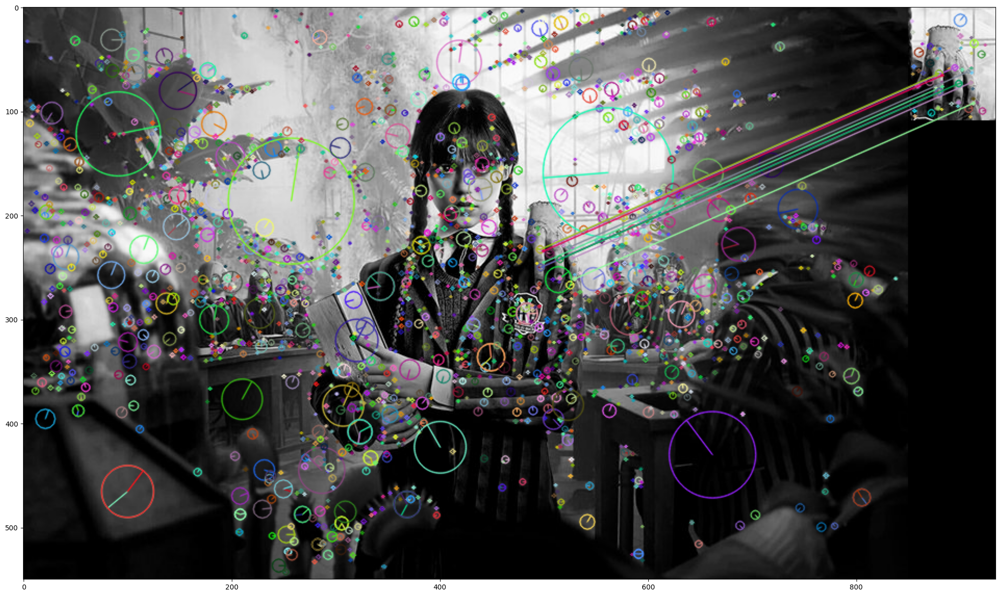

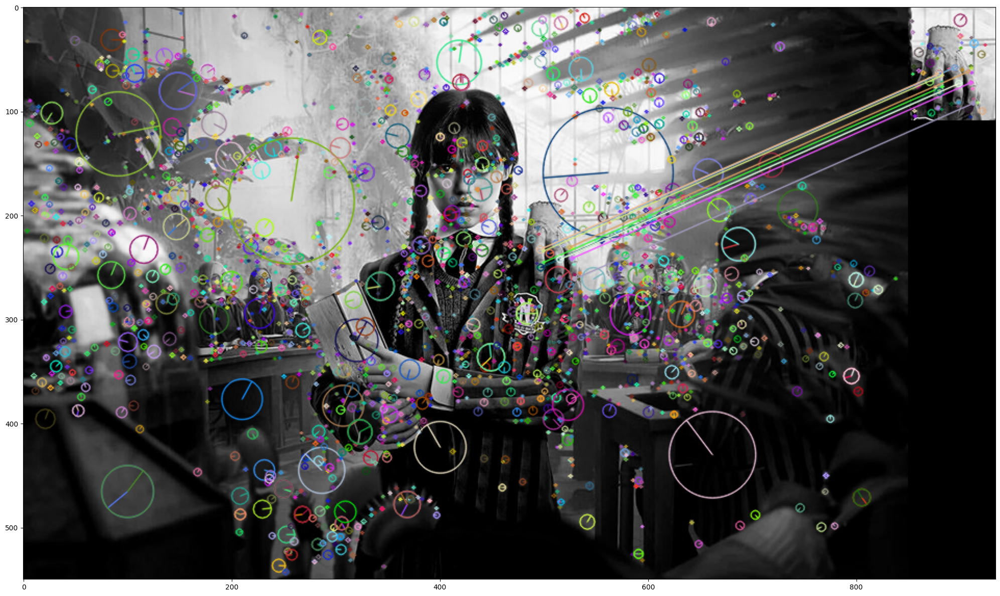

In [ ]:

visualize(image=gloh_flann_matcher(img1, img2))
visualize(image=gloh_custom_matcher(img1, img2))

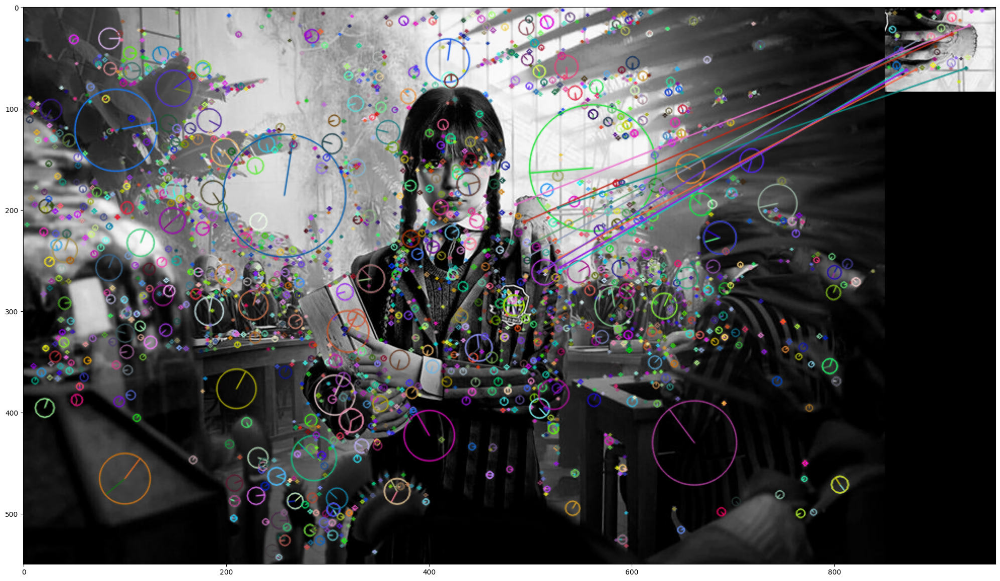

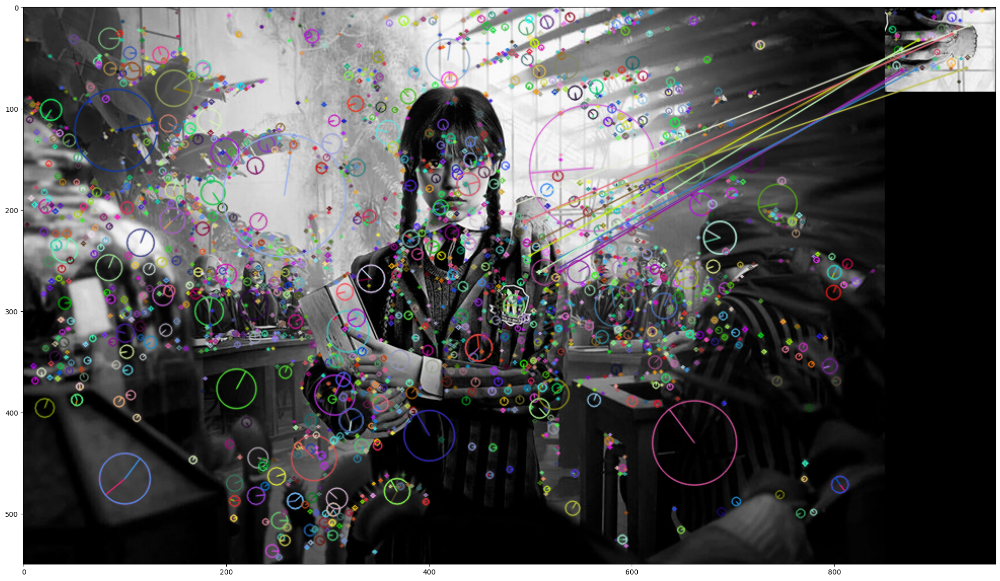

In [ ]:
img90 = cv2.rotate(img2, cv2.ROTATE_90_CLOCKWISE)
visualize(image=gloh_flann_matcher(img1, img90))
visualize(image=gloh_custom_matcher(img1, img90))

In [ ]:
img1 = cv2.imread('/content/drive/MyDrive/CV_images/high_detalized.jpeg')
img2 = cv2.imread('/content/drive/MyDrive/CV_images/high_detalized_segment.png')
     

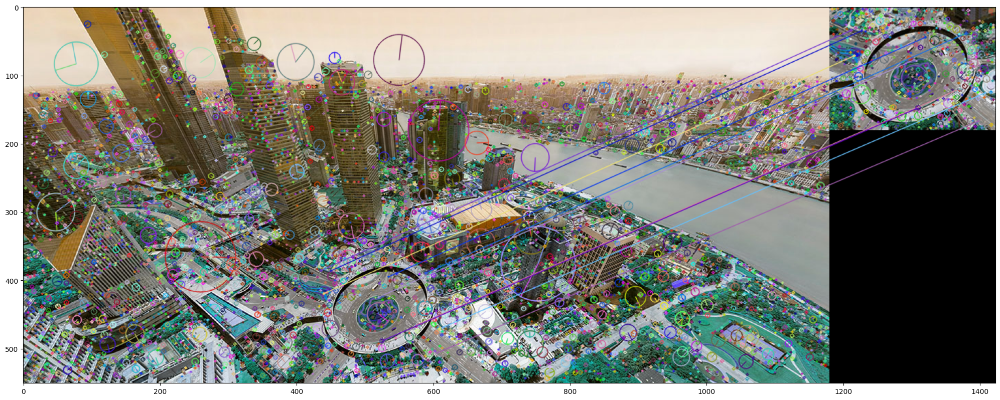

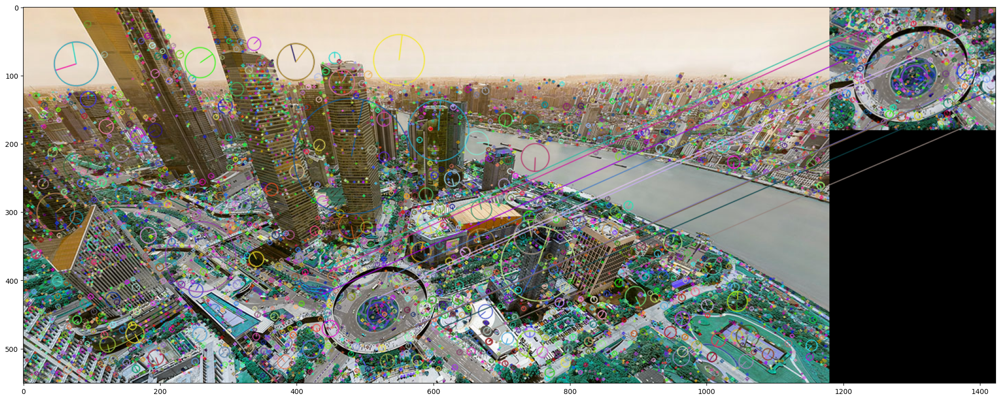

In [ ]:
visualize(image=gloh_flann_matcher(img1, img2))
visualize(image=gloh_custom_matcher(img1, img2))